In [ ]:
print("Hello World")

Hello World


In [ ]:
pip install --upgrade datasets huggingface_hub

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 558.8/558.8 kB 8.4 MB/s eta 0:00:00
  Attempting uninstall: huggingface_hub
    Found existing installation: huggingface-hub 0.33.4
    Uninstalling huggingface-hub-0.33.4:
      Successfully uninstalled huggingface-hub-0.33.4


In [ ]:
# prompt: load dataset from tungvu3196/vlm-project-with-images-with-bbox-images-v5

from huggingface_hub import notebook_login
from datasets import load_dataset

# notebook_login()
dataset = load_dataset("tungvu3196/vlm-project-with-images-with-bbox-images-v7")

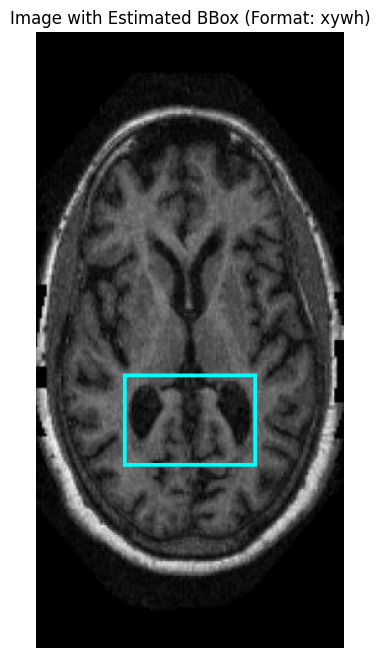

In [ ]:
from PIL import Image, ImageDraw
import matplotlib.pyplot as plt

# --- Load your original image ---
# In Colab, you would upload the image first.
# from google.colab import files
# uploaded = files.upload()
# image_filename = list(uploaded.keys())[0]
# original_image = Image.open(image_filename)

# For demonstration, let's create a placeholder if no image is loaded
try:
    original_image = Image.open("/content/rotate_img3.png") # Replace with your actual image file
except FileNotFoundError:
    print("Image file not found. Creating a black placeholder image.")
    original_image = Image.new('RGB', (400, 400), 'black')


# --- Estimated Bounding Box Coordinates ---
# Choose which format to use for drawing
BBOX_FORMAT = "xywh" # Can be "minmax" or "xywh"

if BBOX_FORMAT == "minmax":
    bbox_norm = [0.25, 0.44, 0.75, 0.77]
else: # xywh
    bbox_norm = [0.50, 0.63, 0.43, 0.15]

# --- Function to draw the box ---
def draw_bbox(image_pil, normalized_bbox, box_format):
    draw_image = image_pil.copy()
    draw = ImageDraw.Draw(draw_image)
    img_width, img_height = image_pil.size

    if box_format == "minmax":
        xmin_norm, ymin_norm, xmax_norm, ymax_norm = normalized_bbox
        xmin = xmin_norm * img_width
        ymin = ymin_norm * img_height
        xmax = xmax_norm * img_width
        ymax = ymax_norm * img_height
        draw.rectangle([(xmin, ymin), (xmax, ymax)], outline="cyan", width=3)
    elif box_format == "xywh":
        xc_norm, yc_norm, w_norm, h_norm = normalized_bbox
        w = w_norm * img_width
        h = h_norm * img_height
        xc = xc_norm * img_width
        yc = yc_norm * img_height
        xmin = xc - (w / 2)
        ymin = yc - (h / 2)
        xmax = xc + (w / 2)
        ymax = yc + (h / 2)
        draw.rectangle([(xmin, ymin), (xmax, ymax)], outline="cyan", width=3)

    return draw_image

# Draw the box on the image
image_with_estimated_box = draw_bbox(original_image, bbox_norm, BBOX_FORMAT)

# Display the result
plt.figure(figsize=(8, 8))
plt.imshow(image_with_estimated_box)
plt.title(f"Image with Estimated BBox (Format: {BBOX_FORMAT})")
plt.axis('off')
plt.show()

In [ ]:
import pandas as pd

# Define the path to your Excel file and the search text
excel_file_path = '/content/data.xlsx'
search_text = "rotate image 90 degrees"

# --- Step 1: Read the Excel file ---
try:
    df_original = pd.read_excel(excel_file_path)
    print(f"Successfully loaded Excel file. Original shape: {df_original.shape}")
except FileNotFoundError:
    print(f"Error: Excel file not found at '{excel_file_path}'."); exit()
except Exception as e:
    print(f"An error occurred while reading the Excel file: {e}"); exit()

# --- Step 2: Perform the filtering ---
if 'Correct' not in df_original.columns:
    print("\nError: The column 'Correct' was not found in the Excel file."); exit()

# Ensure 'Correct' column is treated as a string, filling NaN with empty strings
df_original['Correct_str'] = df_original['Correct'].astype(str).fillna('')

# Filter the DataFrame
df_filtered_by_correct = df_original[df_original['Correct_str'].str.contains(search_text, case=False, na=False)].copy()

print(f"\nFiltering complete.")
print(f"Original total rows in DataFrame: {len(df_original)}")
print(f"Found {len(df_filtered_by_correct)} rows that match the condition.")

# --- Step 3: Debugging - Find the Missing Row(s) ---
# Compare the index of the original DataFrame with the filtered one.

# First, create a temporary boolean Series from the original DataFrame that marks ALL rows
# that should contain the text, according to your manual count in Excel.
# This helps us isolate the problem.
# We'll apply the same filter condition again to get the indices.
should_be_present_mask = df_original['Correct_str'].str.contains(search_text, case=False, na=False)

# Get the indices of rows that were KEPT by the filter
filtered_indices = df_filtered_by_correct.index

# Now, let's find the rows in the original DataFrame that contain the text but somehow didn't make it.
# This is less direct. Let's try another way:
# Let's find all rows that contain "rotate", "image", "90", "degrees" but maybe not in that exact sequence
# or with different spacing. This is more of a fuzzy search.

# A better way: Find the rows that were *not* selected and inspect them.
not_selected_df = df_original[~should_be_present_mask]

print(f"\nThere are {len(not_selected_df)} rows that did NOT match the filter.")
print("Inspecting these non-matching rows for similar text to find the discrepancy...")

possible_missed_rows = []
# Loop through the rows that were NOT selected
for index, row in not_selected_df.iterrows():
    correct_text = row['Correct_str']
    # Check if this text is very similar to our search text (e.g., contains 'rotate' and '90')
    if 'rotate' in correct_text.lower() and '90' in correct_text.lower() and 'degree' in correct_text.lower():
        possible_missed_rows.append(row)

if possible_missed_rows:
    print("\n--- Found Possible Missed Row(s)! ---")
    print("The following row(s) were NOT selected by the filter but look very similar.")
    print("Check them for typos, extra spaces, or special characters:\n")

    for missed_row in possible_missed_rows:
        print("Index:", missed_row.name)
        print("Value in 'Correct' column:", repr(missed_row['Correct'])) # `repr()` shows hidden characters like \n
        print("---")

else:
    print("\nCould not automatically find any obviously missed rows.")
    print("This could mean:")
    print("1. There is a genuine count difference between Excel and what pandas reads (less likely).")
    print("2. The missed row has a more significant typo (e.g., 'roate' instead of 'rotate').")
    print("3. There's an issue with duplicate rows in the source file that you counted but pandas deduplicates implicitly in some views.")

# --- Another check for duplicates ---
# If you expect 82 rows that match, but get 81, it's NOT a duplicate issue.
# A duplicate issue would mean pandas reads 82 rows, but a .drop_duplicates() call results in 81.
# Your issue is that the initial filter is only matching 81 rows.
# The code above is the best way to find the one row that fails the `.str.contains()` check.

Successfully loaded Excel file. Original shape: (1053, 7)

Filtering complete.
Original total rows in DataFrame: 1053
Found 81 rows that match the condition.

There are 972 rows that did NOT match the filter.
Inspecting these non-matching rows for similar text to find the discrepancy...

--- Found Possible Missed Row(s)! ---
The following row(s) were NOT selected by the filter but look very similar.
Check them for typos, extra spaces, or special characters:

Index: 17
Value in 'Correct' column: 'wrong bbox. 2 bbox at the opposite of vertical axis position/ or rotate image 90 degree'
---
Index: 68
Value in 'Correct' column: 'rotate bbox 90 degrees counterclockwise\nMTA = 0: no atrophy, normal choroid fissure width, temporal horn width, and the hippocampus volume'
---
Index: 82
Value in 'Correct' column: 'rotate bbox 90 degrees counterclockwise\nMTA = 0: no atrophy, normal choroid fissure width, temporal horn width, and the hippocampus volume'
---
Index: 85
Value in 'Correct' column: 'ro

Loaded and filtered Excel data. Found 81 rows for rotation.

Loading ONLY the 'test' split from Hugging Face dataset: tungvu3196/vlm-project-with-images-with-bbox-images-v7...
HF 'test' split loaded successfully.

Creating lookup dictionary from the 'test' split for fast matching...
Lookup dictionary created with 1355 entries.

Processing filtered rows and generating new images...

--- Processing Complete ---

Displaying 65 generated image(s) for Patient ID: OAS1_0278


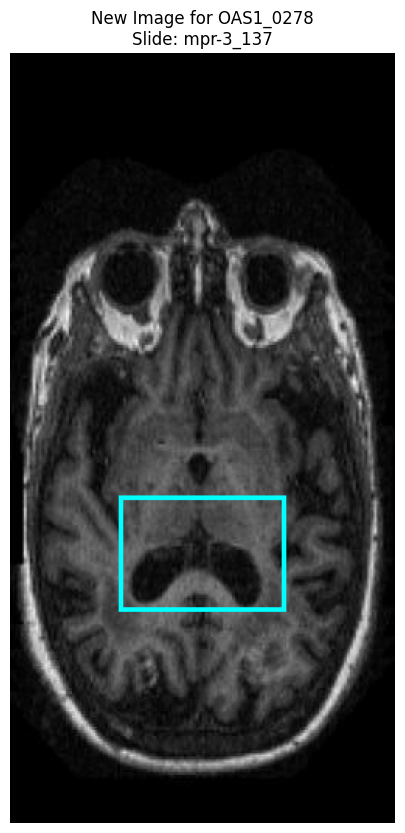

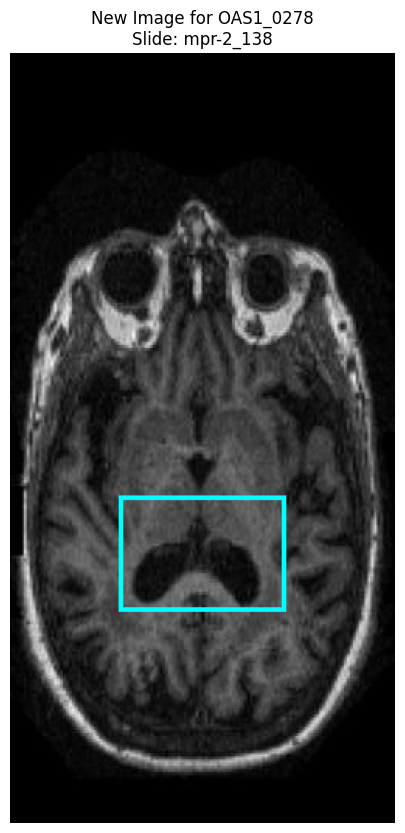

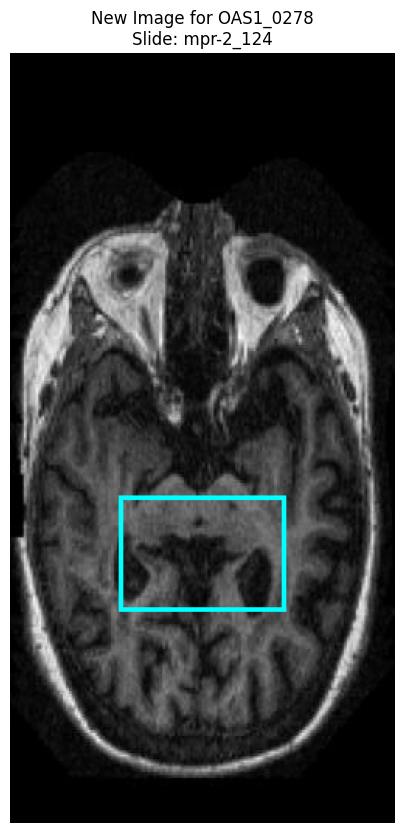

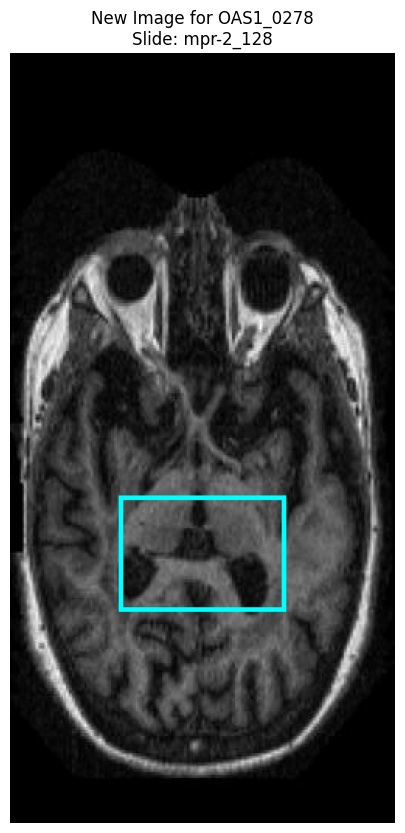

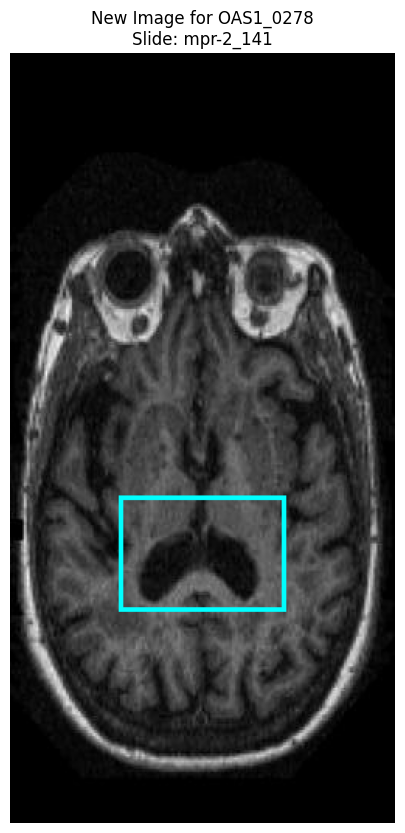

...

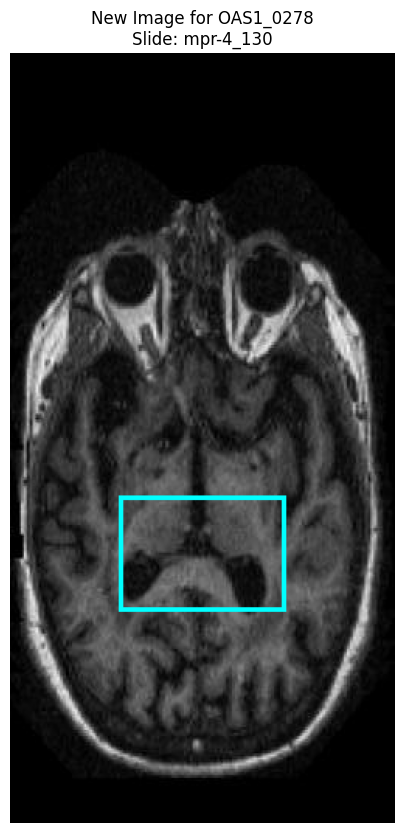

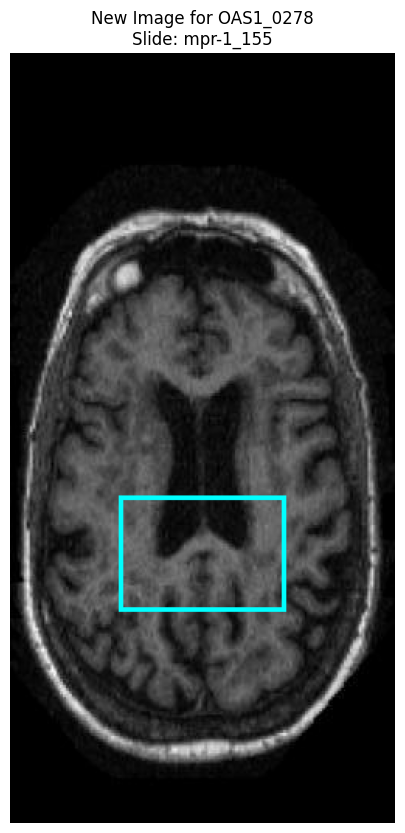

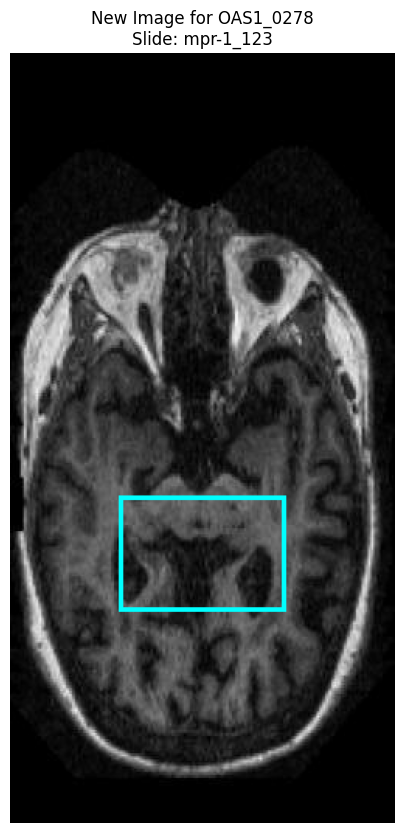

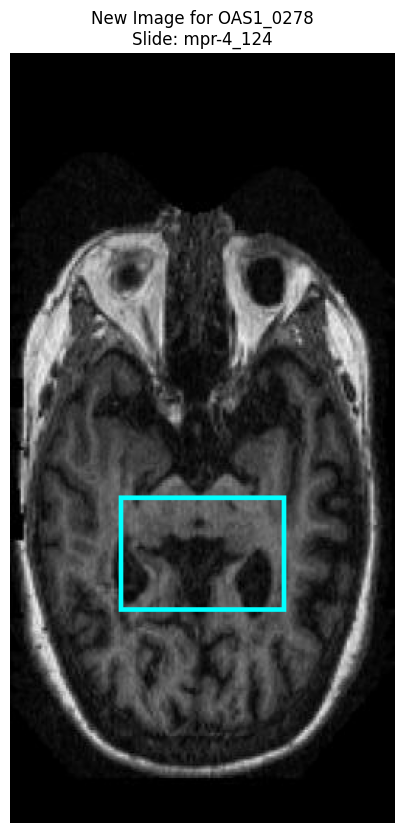

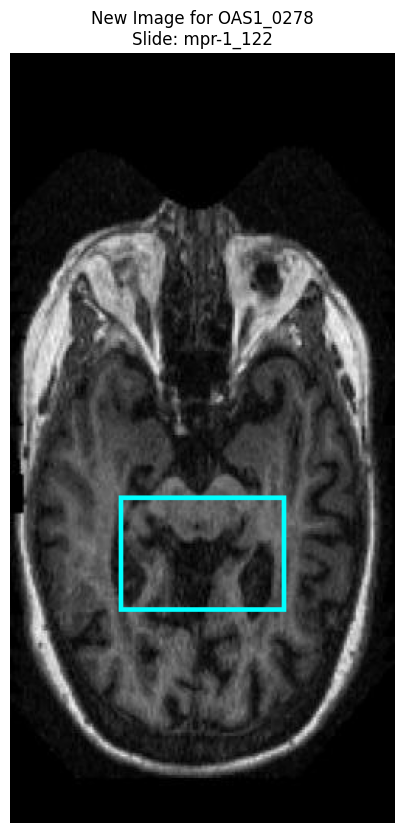

In [ ]:
import pandas as pd
from datasets import load_dataset
from PIL import Image, ImageDraw
import matplotlib.pyplot as plt
import ast
import json

# --- (Assume df_filtered_by_correct is already created from the Excel file) ---
# For this script to be runnable, let's include the creation logic.
excel_file_path = '/content/data.xlsx'
search_text = "rotate image 90 degrees"
try:
    df_original = pd.read_excel(excel_file_path) # Assumes sheet 1
    if 'Correct' not in df_original.columns:
        raise ValueError("Column 'Correct' not found in Excel file.")
    df_original['Correct_str'] = df_original['Correct'].astype(str).fillna('')
    df_filtered_by_correct = df_original[df_original['Correct_str'].str.contains(search_text, case=False, na=False)].copy()
    print(f"Loaded and filtered Excel data. Found {len(df_filtered_by_correct)} rows for rotation.")
except Exception as e:
    print(f"Error preparing df_filtered_by_correct: {e}"); exit()
# --- End of prerequisite block ---


# --- Configuration for this task ---
HF_DATASET_NAME = "tungvu3196/vlm-project-with-images-with-bbox-images-v7"
SPECIAL_PATIENT_ID = 'OAS1_0278'
SPECIAL_BBOX_XYWH = [[0.50, 0.65, 0.43, 0.15]] # Your new bbox, wrapped in a list

# --- Helper Functions (from previous scripts) ---
def draw_bboxes_on_image_pil(image_pil, normalized_bboxes_list, box_format="xywh", color="cyan", width=3):
    if not isinstance(image_pil, Image.Image): return image_pil
    draw_image = image_pil.copy()
    draw = ImageDraw.Draw(draw_image)
    img_width, img_height = image_pil.size
    for bbox_norm in normalized_bboxes_list:
        if len(bbox_norm) != 4: continue
        try: coords = [float(c) for c in bbox_norm]
        except (ValueError, TypeError): continue
        if box_format == "minmax":
            xmin, ymin, xmax, ymax = coords
            draw.rectangle([(xmin * img_width, ymin * img_height), (xmax * img_width, ymax * img_height)], outline=color, width=width)
        elif box_format == "xywh":
            xc_norm, yc_norm, w_norm, h_norm = coords
            abs_w, abs_h = w_norm * img_width, h_norm * img_height
            abs_xc, abs_yc = xc_norm * img_width, yc_norm * img_height
            abs_xmin, abs_ymin = abs_xc - (abs_w / 2), abs_yc - (abs_h / 2)
            draw.rectangle([(abs_xmin, abs_ymin), (abs_xmin + abs_w, abs_ymin + abs_h)], outline=color, width=width)
    return draw_image

def transform_bboxes_for_rotation_90_ccw(normalized_bboxes_list, box_format="xywh"):
    transformed_bboxes = []
    for bbox_norm in normalized_bboxes_list:
        if len(bbox_norm) != 4: continue
        if box_format == "minmax":
            xmin, ymin, xmax, ymax = bbox_norm
            transformed_bboxes.append([ymin, 1.0 - xmax, ymax, 1.0 - xmin])
        elif box_format == "xywh":
            xc, yc, w, h = bbox_norm
            transformed_bboxes.append([yc, 1.0 - xc, h, w])
    return transformed_bboxes

# --- Load ONLY the 'test' split of the Hugging Face Dataset ---
print(f"\nLoading ONLY the 'test' split from Hugging Face dataset: {HF_DATASET_NAME}...")
try:
    hf_test_dataset = load_dataset(HF_DATASET_NAME, split="test")
    print("HF 'test' split loaded successfully.")
except Exception as e:
    print(f"Error loading HF 'test' split: {e}"); exit()

# --- Create a performance-optimized lookup dictionary from ONLY the 'test' split ---
print("\nCreating lookup dictionary from the 'test' split for fast matching...")
hf_test_data_lookup = {
    (str(ex.get("Patient ID")), str(ex.get("Slide"))): ex
    for ex in hf_test_dataset
}
print(f"Lookup dictionary created with {len(hf_test_data_lookup)} entries.")


# --- Main Processing and Verification Loop ---
print("\nProcessing filtered rows and generating new images...")

# This list will store the newly generated images for the special patient ID
generated_images_for_special_patient = []

for index, filter_row in df_filtered_by_correct.iterrows():
    patient_id = str(filter_row.get('Patient ID'))
    slide = str(filter_row.get('Slide'))

    lookup_key = (patient_id, slide)

    # Find the corresponding example in the HF TEST dataset lookup
    hf_example = hf_test_data_lookup.get(lookup_key)

    if hf_example is None:
        # This row from the Excel file was not found in the 'test' split
        continue

    # --- Found a match, now process it ---
    raw_image_to_rotate = hf_example.get('image')
    if not isinstance(raw_image_to_rotate, Image.Image):
        print(f"\nWarning: 'image' column for {patient_id}, {slide} is not a valid image. Skipping.")
        continue

    rotated_image = raw_image_to_rotate.rotate(90, expand=True)

    final_bboxes_to_draw = []
    bbox_format_to_use = "xywh" # Default

    # Conditional Bounding Box Assignment
    if patient_id == SPECIAL_PATIENT_ID:
        final_bboxes_to_draw = SPECIAL_BBOX_XYWH
        bbox_format_to_use = "xywh" # The provided format is [xc, yc, w, h]
    else:
        bbox_str = hf_example.get('Bbox coordinates normalized (X, Y, W, H)')
        if isinstance(bbox_str, str) and bbox_str:
            try:
                parsed_bbox_data = ast.literal_eval(bbox_str)
                original_bboxes = []
                if parsed_bbox_data and isinstance(parsed_bbox_data[0], list):
                    if parsed_bbox_data[0] and isinstance(parsed_bbox_data[0][0], list): original_bboxes = parsed_bbox_data[0]
                    else: original_bboxes = parsed_bbox_data

                bbox_format_of_original = "xywh"
                final_bboxes_to_draw = transform_bboxes_for_rotation_90_ccw(original_bboxes, box_format=bbox_format_of_original)
                bbox_format_to_use = bbox_format_of_original
            except Exception as e:
                print(f"  Warning: Could not parse/transform original bbox for {patient_id}, {slide}. Error: {e}")
        else:
            print(f"  Warning: No original bbox found for {patient_id}, {slide} to transform.")

    # Draw the determined bounding box on the rotated image
    if final_bboxes_to_draw:
        new_image_with_bbox = draw_bboxes_on_image_pil(
            rotated_image,
            final_bboxes_to_draw,
            box_format=bbox_format_to_use
        )

        # If it's the special patient, add the image and info to our verification list
        if patient_id == SPECIAL_PATIENT_ID:
            generated_images_for_special_patient.append({
                "patient_id": patient_id,
                "slide": slide,
                "image": new_image_with_bbox
            })
    # else:
    #     print(f"  No valid bounding boxes to draw for {patient_id}, {slide}.")

print("\n--- Processing Complete ---")

# --- Display Verification Images for the Special Patient ID ---
if generated_images_for_special_patient:
    print(f"\nDisplaying {len(generated_images_for_special_patient)} generated image(s) for Patient ID: {SPECIAL_PATIENT_ID}")
    for item in generated_images_for_special_patient:
        plt.figure(figsize=(8, 10))
        plt.imshow(item["image"])
        plt.title(f"New Image for {item['patient_id']}\nSlide: {item['slide']}")
        plt.axis('off')
        plt.show()
else:
    print(f"\nNo rows matching Patient ID '{SPECIAL_PATIENT_ID}' were found in your filtered Excel data ('df_filtered_by_correct') "
          "that also existed in the HF 'test' split.")

Loaded and filtered Excel data. Found 81 rows for rotation.

Loading ONLY the 'test' split from Hugging Face dataset: tungvu3196/vlm-project-with-images-with-bbox-images-v7...
HF 'test' split loaded successfully.

Creating lookup dictionary from the 'test' split for fast matching...
Lookup dictionary created with 1355 entries.

Processing filtered rows and generating new images...

--- Processing Complete ---

Displaying 5 generated image(s) for Patient ID: OAS1_0052


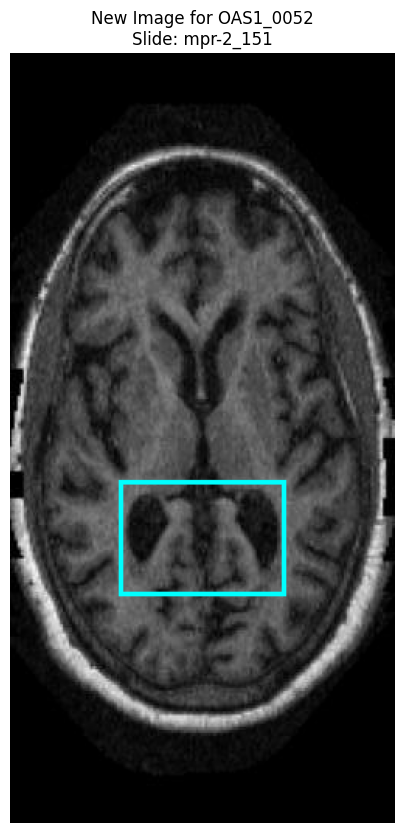

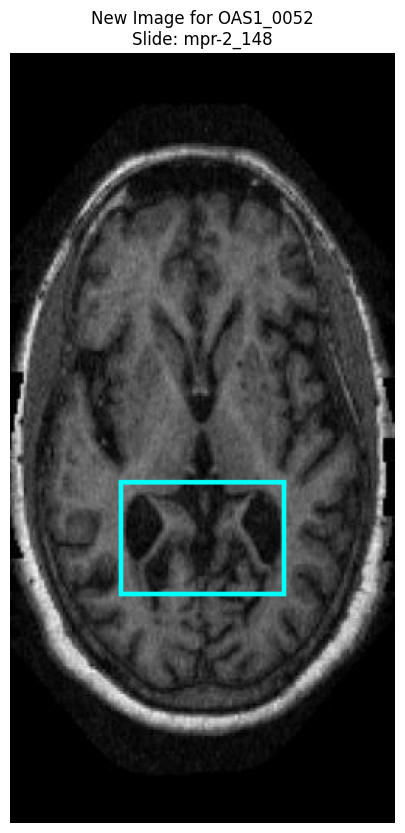

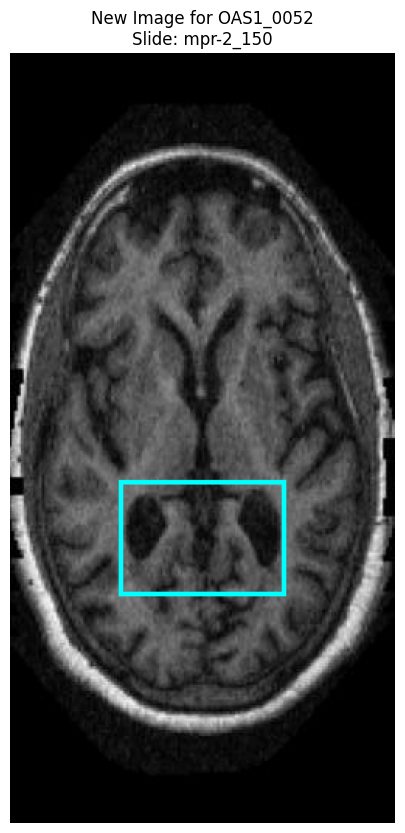

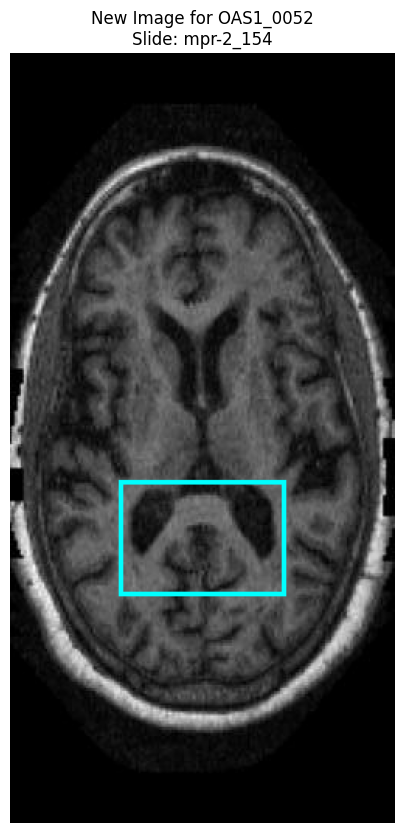

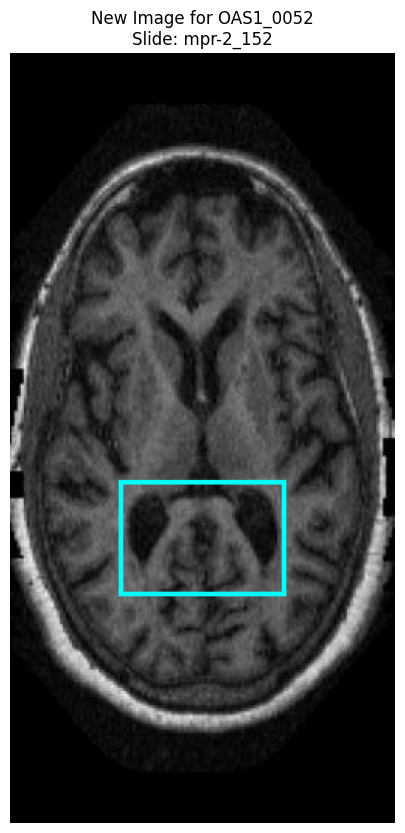

In [ ]:
import pandas as pd
from datasets import load_dataset
from PIL import Image, ImageDraw
import matplotlib.pyplot as plt
import ast
import json

# --- (Assume df_filtered_by_correct is already created from the Excel file) ---
# For this script to be runnable, let's include the creation logic.
excel_file_path = '/content/data.xlsx'
search_text = "rotate image 90 degrees"
try:
    df_original = pd.read_excel(excel_file_path) # Assumes sheet 1
    if 'Correct' not in df_original.columns:
        raise ValueError("Column 'Correct' not found in Excel file.")
    df_original['Correct_str'] = df_original['Correct'].astype(str).fillna('')
    df_filtered_by_correct = df_original[df_original['Correct_str'].str.contains(search_text, case=False, na=False)].copy()
    print(f"Loaded and filtered Excel data. Found {len(df_filtered_by_correct)} rows for rotation.")
except Exception as e:
    print(f"Error preparing df_filtered_by_correct: {e}"); exit()
# --- End of prerequisite block ---


# --- Configuration for this task ---
HF_DATASET_NAME = "tungvu3196/vlm-project-with-images-with-bbox-images-v7"
SPECIAL_PATIENT_ID = 'OAS1_0052'
SPECIAL_BBOX_XYWH = [[0.50, 0.63, 0.43, 0.15]]

# --- Helper Functions (from previous scripts) ---
def draw_bboxes_on_image_pil(image_pil, normalized_bboxes_list, box_format="xywh", color="cyan", width=3):
    if not isinstance(image_pil, Image.Image): return image_pil
    draw_image = image_pil.copy()
    draw = ImageDraw.Draw(draw_image)
    img_width, img_height = image_pil.size
    for bbox_norm in normalized_bboxes_list:
        if len(bbox_norm) != 4: continue
        try: coords = [float(c) for c in bbox_norm]
        except (ValueError, TypeError): continue
        if box_format == "minmax":
            xmin, ymin, xmax, ymax = coords
            draw.rectangle([(xmin * img_width, ymin * img_height), (xmax * img_width, ymax * img_height)], outline=color, width=width)
        elif box_format == "xywh":
            xc_norm, yc_norm, w_norm, h_norm = coords
            abs_w, abs_h = w_norm * img_width, h_norm * img_height
            abs_xc, abs_yc = xc_norm * img_width, yc_norm * img_height
            abs_xmin, abs_ymin = abs_xc - (abs_w / 2), abs_yc - (abs_h / 2)
            draw.rectangle([(abs_xmin, abs_ymin), (abs_xmin + abs_w, abs_ymin + abs_h)], outline=color, width=width)
    return draw_image

def transform_bboxes_for_rotation_90_ccw(normalized_bboxes_list, box_format="xywh"):
    transformed_bboxes = []
    for bbox_norm in normalized_bboxes_list:
        if len(bbox_norm) != 4: continue
        if box_format == "minmax":
            xmin, ymin, xmax, ymax = bbox_norm
            transformed_bboxes.append([ymin, 1.0 - xmax, ymax, 1.0 - xmin])
        elif box_format == "xywh":
            xc, yc, w, h = bbox_norm
            transformed_bboxes.append([yc, 1.0 - xc, h, w])
    return transformed_bboxes

# --- Load ONLY the 'test' split of the Hugging Face Dataset ---
print(f"\nLoading ONLY the 'test' split from Hugging Face dataset: {HF_DATASET_NAME}...")
try:
    hf_test_dataset = load_dataset(HF_DATASET_NAME, split="test")
    print("HF 'test' split loaded successfully.")
except Exception as e:
    print(f"Error loading HF 'test' split: {e}"); exit()

# --- Create a performance-optimized lookup dictionary from ONLY the 'test' split ---
print("\nCreating lookup dictionary from the 'test' split for fast matching...")
hf_test_data_lookup = {
    (str(ex.get("Patient ID")), str(ex.get("Slide"))): ex
    for ex in hf_test_dataset
}
print(f"Lookup dictionary created with {len(hf_test_data_lookup)} entries.")


# --- Main Processing and Verification Loop ---
print("\nProcessing filtered rows and generating new images...")

# This list will store the newly generated images for the special patient ID
generated_images_for_special_patient = []

for index, filter_row in df_filtered_by_correct.iterrows():
    patient_id = str(filter_row.get('Patient ID'))
    slide = str(filter_row.get('Slide'))

    lookup_key = (patient_id, slide)

    # Find the corresponding example in the HF TEST dataset lookup
    hf_example = hf_test_data_lookup.get(lookup_key)

    if hf_example is None:
        # This row from the Excel file was not found in the 'test' split
        continue

    # --- Found a match, now process it ---
    raw_image_to_rotate = hf_example.get('image')
    if not isinstance(raw_image_to_rotate, Image.Image):
        print(f"\nWarning: 'image' column for {patient_id}, {slide} is not a valid image. Skipping.")
        continue

    rotated_image = raw_image_to_rotate.rotate(90, expand=True)

    final_bboxes_to_draw = []
    bbox_format_to_use = "xywh" # Default

    # Conditional Bounding Box Assignment
    if patient_id == SPECIAL_PATIENT_ID:
        final_bboxes_to_draw = SPECIAL_BBOX_XYWH
        bbox_format_to_use = "xywh" # The provided format is [xc, yc, w, h]
    else:
        bbox_str = hf_example.get('Bbox coordinates normalized (X, Y, W, H)')
        if isinstance(bbox_str, str) and bbox_str:
            try:
                parsed_bbox_data = ast.literal_eval(bbox_str)
                original_bboxes = []
                if parsed_bbox_data and isinstance(parsed_bbox_data[0], list):
                    if parsed_bbox_data[0] and isinstance(parsed_bbox_data[0][0], list): original_bboxes = parsed_bbox_data[0]
                    else: original_bboxes = parsed_bbox_data

                bbox_format_of_original = "xywh"
                final_bboxes_to_draw = transform_bboxes_for_rotation_90_ccw(original_bboxes, box_format=bbox_format_of_original)
                bbox_format_to_use = bbox_format_of_original
            except Exception as e:
                print(f"  Warning: Could not parse/transform original bbox for {patient_id}, {slide}. Error: {e}")
        else:
            print(f"  Warning: No original bbox found for {patient_id}, {slide} to transform.")

    # Draw the determined bounding box on the rotated image
    if final_bboxes_to_draw:
        new_image_with_bbox = draw_bboxes_on_image_pil(
            rotated_image,
            final_bboxes_to_draw,
            box_format=bbox_format_to_use
        )

        # If it's the special patient, add the image and info to our verification list
        if patient_id == SPECIAL_PATIENT_ID:
            generated_images_for_special_patient.append({
                "patient_id": patient_id,
                "slide": slide,
                "image": new_image_with_bbox
            })
    # else:
    #     print(f"  No valid bounding boxes to draw for {patient_id}, {slide}.")

print("\n--- Processing Complete ---")

# --- Display Verification Images for the Special Patient ID ---
if generated_images_for_special_patient:
    print(f"\nDisplaying {len(generated_images_for_special_patient)} generated image(s) for Patient ID: {SPECIAL_PATIENT_ID}")
    for item in generated_images_for_special_patient:
        plt.figure(figsize=(8, 10))
        plt.imshow(item["image"])
        plt.title(f"New Image for {item['patient_id']}\nSlide: {item['slide']}")
        plt.axis('off')
        plt.show()
else:
    print(f"\nNo rows matching Patient ID '{SPECIAL_PATIENT_ID}' were found in your filtered Excel data ('df_filtered_by_correct') "
          "that also existed in the HF 'test' split.")

Loaded and filtered Excel data. Found 81 rows to augment.
Created lookup set with 81 (Patient ID, Slide) pairs to augment.

Loading Hugging Face dataset: tungvu3196/vlm-project-with-images-with-bbox-images-v7...
HF dataset loaded successfully.

Applying augmentations to the 'test' split...


Map:   0%|          | 0/1355 [00:00<?, ? examples/s]

Augmentation of 'test' split complete.

Verifying one of the updated rows for the special patient...


Filter:   0%|          | 0/1355 [00:00<?, ? examples/s]

Verifying Deliverable: OAS1_0278_MR1_mpr-3_137.jpg
New Bbox Coordinates String: [[0.5, 0.65, 0.43, 0.15]]


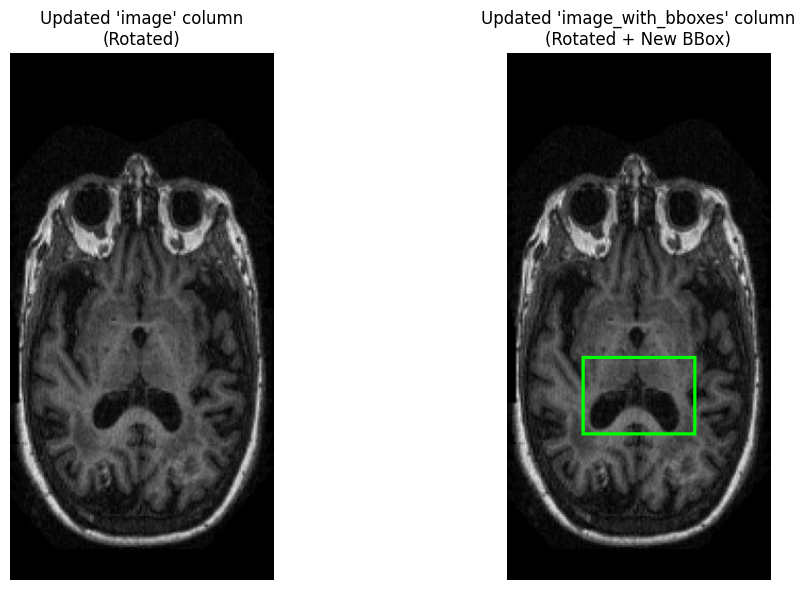

In [ ]:
import pandas as pd
from datasets import load_dataset, DatasetDict, Image as HFImageFeatures
from PIL import Image, ImageDraw
import matplotlib.pyplot as plt
import ast
import json

# --- (Assume df_filtered_by_correct is already created from the Excel file) ---
# For this script to be runnable, let's include the creation logic.
excel_file_path = '/content/data.xlsx'
search_text = "rotate image 90 degrees"
try:
    df_original = pd.read_excel(excel_file_path) # Assumes sheet 1
    if 'Correct' not in df_original.columns: raise ValueError("Column 'Correct' not found.")
    df_original['Correct_str'] = df_original['Correct'].astype(str).fillna('')
    df_filtered_by_correct = df_original[df_original['Correct_str'].str.contains(search_text, case=False, na=False)].copy()
    print(f"Loaded and filtered Excel data. Found {len(df_filtered_by_correct)} rows to augment.")
except Exception as e:
    print(f"Error preparing df_filtered_by_correct: {e}"); exit()
# --- End of prerequisite block ---


# --- Configuration for this task ---
HF_DATASET_NAME = "tungvu3196/vlm-project-with-images-with-bbox-images-v7" # The dataset to update
SPECIAL_PATIENT_ID = 'OAS1_0278'
SPECIAL_BBOX_XYWH = [[0.50, 0.65, 0.43, 0.15]]

# Create a lookup set from df_filtered_by_correct for fast checks inside .map()
# This is more efficient than passing a large DataFrame.
# The set will contain tuples of (Patient ID, Slide).
target_rows_to_augment_set = set(
    df_filtered_by_correct.dropna(subset=['Patient ID', 'Slide'])
                         .apply(lambda row: (str(row['Patient ID']), str(row['Slide'])), axis=1)
)
print(f"Created lookup set with {len(target_rows_to_augment_set)} (Patient ID, Slide) pairs to augment.")


# --- Helper Functions (from previous scripts) ---
def draw_bboxes_on_image_pil(image_pil, normalized_bboxes_list, box_format="xywh", color="lime", width=3):
    if not isinstance(image_pil, Image.Image): return image_pil
    draw_image = image_pil.copy()
    draw = ImageDraw.Draw(draw_image)
    img_width, img_height = image_pil.size
    for bbox_norm in normalized_bboxes_list:
        if len(bbox_norm) != 4: continue
        try: coords = [float(c) for c in bbox_norm]
        except (ValueError, TypeError): continue
        if box_format == "minmax":
            xmin, ymin, xmax, ymax = coords
            draw.rectangle([(xmin * img_width, ymin * img_height), (xmax * img_width, ymax * img_height)], outline=color, width=width)
        elif box_format == "xywh":
            xc_norm, yc_norm, w_norm, h_norm = coords
            abs_w, abs_h = w_norm * img_width, h_norm * img_height
            abs_xc, abs_yc = xc_norm * img_width, yc_norm * img_height
            abs_xmin, abs_ymin = abs_xc - (abs_w / 2), abs_yc - (abs_h / 2)
            draw.rectangle([(abs_xmin, abs_ymin), (abs_xmin + abs_w, abs_ymin + abs_h)], outline=color, width=width)
    return draw_image

def transform_bboxes_for_rotation_90_ccw(normalized_bboxes_list, box_format="xywh"):
    transformed_bboxes = []
    for bbox_norm in normalized_bboxes_list:
        if len(bbox_norm) != 4: continue
        if box_format == "minmax":
            xmin, ymin, xmax, ymax = bbox_norm
            transformed_bboxes.append([ymin, 1.0 - xmax, ymax, 1.0 - xmin])
        elif box_format == "xywh":
            xc, yc, w, h = bbox_norm
            transformed_bboxes.append([yc, 1.0 - xc, h, w])
    return transformed_bboxes

# --- Main Augmentation Function for .map() ---
def augment_target_rows(example):
    """
    Checks if an example is in the target set. If so, it performs the
    rotation and bbox update, modifying the example dictionary in place.
    """
    patient_id = str(example.get("Patient ID", ""))
    slide = str(example.get("Slide", ""))

    # Check if the current row is one we need to augment
    if (patient_id, slide) in target_rows_to_augment_set:
        original_image_pil = example.get('image')

        # Ensure we have a valid image to work with
        if not isinstance(original_image_pil, Image.Image):
            print(f"  Warning: 'image' for {patient_id}, {slide} is not a valid image. Skipping augmentation for this row.")
            return example

        # 1. Rotate the 'image'
        rotated_image_pil = original_image_pil.rotate(90, expand=True)

        # 2. Determine the new bounding box coordinates
        new_bboxes_norm = []
        bbox_format_to_use = "xywh" # Default format

        if patient_id == SPECIAL_PATIENT_ID:
            new_bboxes_norm = SPECIAL_BBOX_XYWH
            bbox_format_to_use = "xywh" # This special box is xywh
        else:
            bbox_str = example.get('Bbox coordinates normalized (X, Y, W, H)')
            if isinstance(bbox_str, str) and bbox_str:
                try:
                    parsed_bbox_data = ast.literal_eval(bbox_str)
                    original_bboxes = []
                    if parsed_bbox_data and isinstance(parsed_bbox_data[0], list):
                        if parsed_bbox_data[0] and isinstance(parsed_bbox_data[0][0], list): original_bboxes = parsed_bbox_data[0]
                        else: original_bboxes = parsed_bbox_data

                    bbox_format_of_original = "xywh" # Assuming original format
                    new_bboxes_norm = transform_bboxes_for_rotation_90_ccw(original_bboxes, box_format=bbox_format_of_original)
                    bbox_format_to_use = bbox_format_of_original
                except Exception:
                    # If parsing fails, new_bboxes_norm remains empty
                    pass

        # 3. Update the example dictionary with the new values
        example['image'] = rotated_image_pil # Update 'image' with the rotated version

        if new_bboxes_norm:
            example['Bbox coordinates normalized (X, Y, W, H)'] = json.dumps(new_bboxes_norm)

            image_with_new_bboxes = draw_bboxes_on_image_pil(
                rotated_image_pil,
                new_bboxes_norm,
                box_format=bbox_format_to_use
            )
            example['image_with_bboxes'] = image_with_new_bboxes
        else:
            # If no valid new bboxes could be determined, keep old bbox string
            # and set image_with_bboxes to the (now rotated) raw image.
            example['image_with_bboxes'] = rotated_image_pil

    return example

# --- Load HF Dataset and Apply Transformations ---
print(f"\nLoading Hugging Face dataset: {HF_DATASET_NAME}...")
try:
    hf_dataset_dict = load_dataset(HF_DATASET_NAME)
    print("HF dataset loaded successfully.")

    # We are only modifying the 'test' split as per your previous requests
    target_split_name = 'test'
    if target_split_name in hf_dataset_dict:
        print(f"\nApplying augmentations to the '{target_split_name}' split...")

        original_split = hf_dataset_dict[target_split_name]

        # Define the features to ensure image columns are correctly handled
        features = original_split.features.copy()
        features['image'] = HFImageFeatures()
        features['image_with_bboxes'] = HFImageFeatures()

        augmented_split = original_split.map(
            augment_target_rows,
            features=features,
            # batched=True, batch_size=10 # can speed up if function is complex
        )

        # Update the dictionary with the augmented split
        hf_dataset_dict[target_split_name] = augmented_split
        print(f"Augmentation of '{target_split_name}' split complete.")

    else:
        print(f"Warning: '{target_split_name}' split not found in the dataset.")

except Exception as e:
    print(f"An error occurred: {e}"); exit()


# --- Verification ---
print("\nVerifying one of the updated rows for the special patient...")
if 'test' in hf_dataset_dict:
    updated_test_split = hf_dataset_dict['test']

    # Filter to find the special patient rows in the updated dataset
    special_patient_rows = updated_test_split.filter(
        lambda ex: ex.get("Patient ID") == SPECIAL_PATIENT_ID and \
                   (ex.get("Patient ID"), ex.get("Slide")) in target_rows_to_augment_set
    )

    if len(special_patient_rows) > 0:
        example_to_verify = special_patient_rows[0] # Just show the first one

        print(f"Verifying Deliverable: {example_to_verify.get('Deliverable')}")
        print(f"New Bbox Coordinates String: {example_to_verify.get('Bbox coordinates normalized (X, Y, W, H)')}")

        fig, axes = plt.subplots(1, 2, figsize=(12, 6))

        axes[0].imshow(example_to_verify.get('image'))
        axes[0].set_title("Updated 'image' column\n(Rotated)")
        axes[0].axis('off')

        axes[1].imshow(example_to_verify.get('image_with_bboxes'))
        axes[1].set_title("Updated 'image_with_bboxes' column\n(Rotated + New BBox)")
        axes[1].axis('off')

        plt.tight_layout()
        plt.show()
    else:
        print(f"No rows for special patient '{SPECIAL_PATIENT_ID}' were found in the augmented data for verification.")
else:
    print("'test' split not found for verification.")

# The `hf_dataset_dict` variable now holds the fully updated dataset, ready to be pushed to the Hub.
# from huggingface_hub import notebook_login
# notebook_login()
# hf_dataset_dict.push_to_hub("your_username/your_final_augmented_dataset")

Loaded and filtered Excel data. Found 81 rows to augment.
Created lookup set with 81 (Patient ID, Slide) pairs to augment.

Loading Hugging Face dataset: tungvu3196/vlm-project-with-images-with-bbox-images-v7-fix-rotated-image...
HF dataset loaded successfully.

Applying bbox updates to the 'test' split...


Map:   0%|          | 0/1355 [00:00<?, ? examples/s]

Update of 'test' split complete.

Verifying one of the updated rows for the special patient ('OAS1_0052')...


Filter:   0%|          | 0/1355 [00:00<?, ? examples/s]

Verifying Deliverable: OAS1_0052_MR1_mpr-2_151.jpg
  New Bbox Coords String: [[0.5, 0.63, 0.43, 0.15]]
  New A1 Value:           [[0.5, 0.63, 0.43, 0.15]]
  ✅ VERIFICATION PASSED: 'A1' matches 'Bbox coordinates...' column.


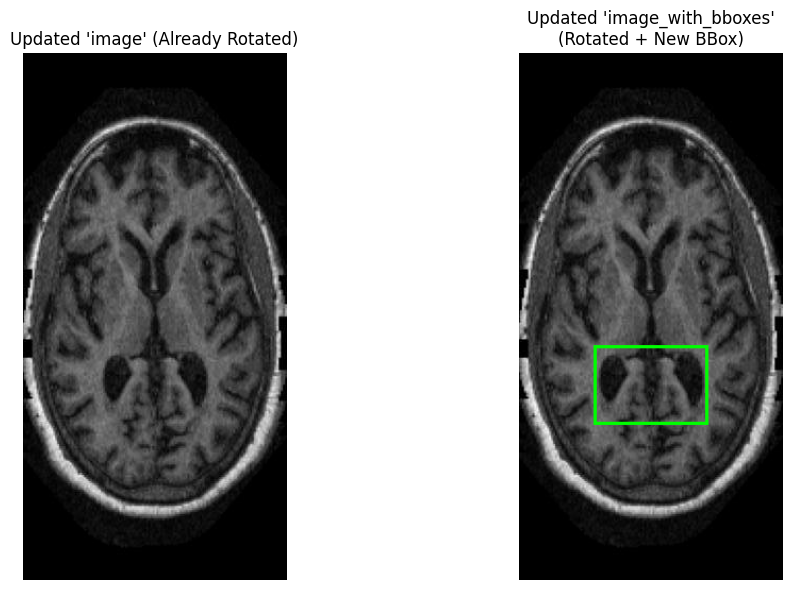

In [ ]:
import pandas as pd
from datasets import load_dataset, DatasetDict, Image as HFImageFeatures
from PIL import Image, ImageDraw
import matplotlib.pyplot as plt
import ast
import json

# --- (Assume df_filtered_by_correct is already created from the Excel file) ---
excel_file_path = '/content/data.xlsx'
search_text = "rotate image 90 degrees"
try:
    df_original = pd.read_excel(excel_file_path)
    if 'Correct' not in df_original.columns: raise ValueError("Column 'Correct' not found.")
    df_original['Correct_str'] = df_original['Correct'].astype(str).fillna('')
    df_filtered_by_correct = df_original[df_original['Correct_str'].str.contains(search_text, case=False, na=False)].copy()
    print(f"Loaded and filtered Excel data. Found {len(df_filtered_by_correct)} rows to augment.")
except Exception as e:
    print(f"Error preparing df_filtered_by_correct: {e}"); exit()
# --- End of prerequisite block ---


# --- Configuration for this task ---
HF_DATASET_NAME = "tungvu3196/vlm-project-with-images-with-bbox-images-v7-fix-rotated-image"
SPECIAL_PATIENT_ID = 'OAS1_0052'
SPECIAL_BBOX_XYWH = [[0.50, 0.63, 0.43, 0.15]]

target_rows_to_augment_set = set(
    df_filtered_by_correct.dropna(subset=['Patient ID', 'Slide'])
                         .apply(lambda row: (str(row['Patient ID']), str(row['Slide'])), axis=1)
)
print(f"Created lookup set with {len(target_rows_to_augment_set)} (Patient ID, Slide) pairs to augment.")


# --- Helper Functions (from previous scripts) ---
def draw_bboxes_on_image_pil(image_pil, normalized_bboxes_list, box_format="xywh", color="lime", width=3):
    if not isinstance(image_pil, Image.Image): return image_pil
    draw_image = image_pil.copy()
    draw = ImageDraw.Draw(draw_image)
    img_width, img_height = image_pil.size
    for bbox_norm in normalized_bboxes_list:
        if len(bbox_norm) != 4: continue
        try: coords = [float(c) for c in bbox_norm]
        except (ValueError, TypeError): continue
        if box_format == "minmax":
            xmin, ymin, xmax, ymax = coords
            draw.rectangle([(xmin * img_width, ymin * img_height), (xmax * img_width, ymax * img_height)], outline=color, width=width)
        elif box_format == "xywh":
            xc_norm, yc_norm, w_norm, h_norm = coords
            abs_w, abs_h = w_norm * img_width, h_norm * img_height
            abs_xc, abs_yc = xc_norm * img_width, yc_norm * img_height
            abs_xmin, abs_ymin = abs_xc - (abs_w / 2), abs_yc - (abs_h / 2)
            draw.rectangle([(abs_xmin, abs_ymin), (abs_xmin + abs_w, abs_ymin + abs_h)], outline=color, width=width)
    return draw_image

def transform_bboxes_for_rotation_90_ccw(normalized_bboxes_list, box_format="xywh"):
    transformed_bboxes = []
    for bbox_norm in normalized_bboxes_list:
        if len(bbox_norm) != 4: continue
        if box_format == "minmax":
            xmin, ymin, xmax, ymax = bbox_norm
            transformed_bboxes.append([ymin, 1.0 - xmax, ymax, 1.0 - xmin])
        elif box_format == "xywh":
            xc, yc, w, h = bbox_norm
            transformed_bboxes.append([yc, 1.0 - xc, h, w])
    return transformed_bboxes

# --- Main Augmentation Function (Simplified: No Rotation) ---
def update_bboxes_for_rotated_image(example):
    """
    Assumes 'image' is already rotated. This function calculates the correct
    bboxes, updates the coordinate and A1 columns, and redraws 'image_with_bboxes'.
    """
    patient_id = str(example.get("Patient ID", ""))
    slide = str(example.get("Slide", ""))

    if (patient_id, slide) in target_rows_to_augment_set:
        # The image in the 'image' column is already rotated.
        rotated_image_pil = example.get('image')
        if not isinstance(rotated_image_pil, Image.Image):
            print(f"  Warning: 'image' for {patient_id}, {slide} is not a valid image. Skipping.")
            return example

        new_bboxes_norm = []
        bbox_format_to_use = "xywh"

        if patient_id == SPECIAL_PATIENT_ID:
            new_bboxes_norm = SPECIAL_BBOX_XYWH
            bbox_format_to_use = "xywh"
        else:
            # IMPORTANT: The 'Bbox coordinates...' column in the source dataset
            # STILL CONTAINS THE *ORIGINAL*, UNTRANSFORMED COORDINATES. We need to transform them.
            bbox_str_original = example.get('Bbox coordinates normalized (X, Y, W, H)')
            if isinstance(bbox_str_original, str) and bbox_str_original:
                try:
                    # Parse the ORIGINAL coordinates
                    parsed_bbox_data = ast.literal_eval(bbox_str_original)
                    original_bboxes = []
                    if parsed_bbox_data and isinstance(parsed_bbox_data[0], list):
                        if parsed_bbox_data[0] and isinstance(parsed_bbox_data[0][0], list): original_bboxes = parsed_bbox_data[0]
                        else: original_bboxes = parsed_bbox_data

                    # Transform them
                    bbox_format_of_original = "xywh" # Assuming original format
                    new_bboxes_norm = transform_bboxes_for_rotation_90_ccw(original_bboxes, box_format=bbox_format_of_original)
                    bbox_format_to_use = bbox_format_of_original
                except Exception:
                    pass

        # --- Update the example dictionary with the new bbox data ---
        if new_bboxes_norm:
            new_bbox_string = json.dumps(new_bboxes_norm)

            # 1. Update the bbox coordinates column
            example['Bbox coordinates normalized (X, Y, W, H)'] = new_bbox_string

            # 2. Update the A1 column
            example['A1'] = new_bbox_string

            # 3. Draw the new bboxes on the already-rotated image
            image_with_new_bboxes = draw_bboxes_on_image_pil(
                rotated_image_pil, # Use the image from the 'image' column
                new_bboxes_norm,
                box_format=bbox_format_to_use
            )
            example['image_with_bboxes'] = image_with_new_bboxes
        else:
            # If bbox processing failed, still ensure 'image_with_bboxes' is a copy of 'image'
            example['A1'] = "N/A"
            example['image_with_bboxes'] = rotated_image_pil

    return example

# --- Load HF Dataset and Apply Transformations ---
print(f"\nLoading Hugging Face dataset: {HF_DATASET_NAME}...")
try:
    hf_dataset_dict = load_dataset(HF_DATASET_NAME)
    print("HF dataset loaded successfully.")

    target_split_name = 'test'
    if target_split_name in hf_dataset_dict:
        print(f"\nApplying bbox updates to the '{target_split_name}' split...")
        original_split = hf_dataset_dict[target_split_name]

        # The schema/features are not changing, so we don't strictly need to pass them,
        # but it's good practice, especially with Image features.
        features = original_split.features.copy()

        augmented_split = original_split.map(
            update_bboxes_for_rotated_image, # Use the new simplified function
            features=features
        )

        hf_dataset_dict[target_split_name] = augmented_split
        print(f"Update of '{target_split_name}' split complete.")
    else:
        print(f"Warning: '{target_split_name}' split not found in the dataset.")

except Exception as e:
    print(f"An error occurred: {e}"); exit()


# --- Verification ---
print(f"\nVerifying one of the updated rows for the special patient ('{SPECIAL_PATIENT_ID}')...")
if 'test' in hf_dataset_dict:
    updated_test_split = hf_dataset_dict['test']

    special_patient_rows = updated_test_split.filter(
        lambda ex: ex.get("Patient ID") == SPECIAL_PATIENT_ID and \
                   (ex.get("Patient ID"), ex.get("Slide")) in target_rows_to_augment_set
    )

    if len(special_patient_rows) > 0:
        example_to_verify = special_patient_rows[0]

        print(f"Verifying Deliverable: {example_to_verify.get('Deliverable')}")
        print(f"  New Bbox Coords String: {example_to_verify.get('Bbox coordinates normalized (X, Y, W, H)')}")
        print(f"  New A1 Value:           {example_to_verify.get('A1')}")

        if example_to_verify.get('A1') == example_to_verify.get('Bbox coordinates normalized (X, Y, W, H)'):
            print("  ✅ VERIFICATION PASSED: 'A1' matches 'Bbox coordinates...' column.")
        else:
            print("  ❌ VERIFICATION FAILED: 'A1' does NOT match 'Bbox coordinates...' column.")

        fig, axes = plt.subplots(1, 2, figsize=(12, 6))
        axes[0].imshow(example_to_verify.get('image')); axes[0].set_title("Updated 'image' (Already Rotated)"); axes[0].axis('off')
        axes[1].imshow(example_to_verify.get('image_with_bboxes')); axes[1].set_title("Updated 'image_with_bboxes'\n(Rotated + New BBox)"); axes[1].axis('off')
        plt.tight_layout(); plt.show()
    else:
        print(f"No rows for special patient '{SPECIAL_PATIENT_ID}' were found in the augmented data for verification.")
else:
    print("'test' split not found for verification.")

In [ ]:
import os
os.environ["HF_TOKEN"] = "######"  # Replace with your actual token


from datasets import DatasetDict # Import DatasetDict
hf_dataset_dict.push_to_hub("tungvu3196/vlm-project-with-images-with-bbox-images-v7-fix-rotated-image")


Uploading the dataset shards:   0%|          | 0/4 [00:00<?, ? shards/s]

Map:   0%|          | 0/2755 [00:00<?, ? examples/s]

Creating parquet from Arrow format:   0%|          | 0/28 [00:00<?, ?ba/s]

Processing Files (0 / 0)                : |          |  0.00B /  0.00B            

New Data Upload                         : |          |  0.00B /  0.00B            

                                        :   3%|3         | 16.7MB /  484MB            

Map:   0%|          | 0/2755 [00:00<?, ? examples/s]

Creating parquet from Arrow format:   0%|          | 0/28 [00:00<?, ?ba/s]

Processing Files (0 / 0)                : |          |  0.00B /  0.00B            

New Data Upload                         : |          |  0.00B /  0.00B            

                                        :   7%|6         | 33.5MB /  485MB            

Map:   0%|          | 0/2755 [00:00<?, ? examples/s]

Creating parquet from Arrow format:   0%|          | 0/28 [00:00<?, ?ba/s]

Processing Files (0 / 0)                : |          |  0.00B /  0.00B            

New Data Upload                         : |          |  0.00B /  0.00B            

                                        :   7%|6         | 33.5MB /  485MB            

Map:   0%|          | 0/2755 [00:00<?, ? examples/s]

Creating parquet from Arrow format:   0%|          | 0/28 [00:00<?, ?ba/s]

Processing Files (0 / 0)                : |          |  0.00B /  0.00B            

New Data Upload                         : |          |  0.00B /  0.00B            

                                        :   7%|7         | 33.5MB /  451MB            

Uploading the dataset shards:   0%|          | 0/1 [00:00<?, ? shards/s]

Map:   0%|          | 0/1355 [00:00<?, ? examples/s]

Creating parquet from Arrow format:   0%|          | 0/14 [00:00<?, ?ba/s]

Processing Files (0 / 0)                : |          |  0.00B /  0.00B            

New Data Upload                         : |          |  0.00B /  0.00B            

                                        :   9%|9         | 22.0MB /  233MB            

CommitInfo(commit_url='https://huggingface.co/datasets/tungvu3196/vlm-project-with-images-with-bbox-images-v7-fix-rotated-image/commit/d4c5b3dbb08386477e4eaf1905e363eafa5454f9', commit_message='Upload dataset', commit_description='', oid='d4c5b3dbb08386477e4eaf1905e363eafa5454f9', pr_url=None, repo_url=RepoUrl('https://huggingface.co/datasets/tungvu3196/vlm-project-with-images-with-bbox-images-v7-fix-rotated-image', endpoint='https://huggingface.co', repo_type='dataset', repo_id='tungvu3196/vlm-project-with-images-with-bbox-images-v7-fix-rotated-image'), pr_revision=None, pr_num=None)

In [ ]:
from datasets import load_dataset, DatasetDict

# --- Configuration ---
HF_DATASET_NAME = "tungvu3196/vlm-project-with-images-with-bbox-images-v7-fix-rotated-image"
BBOX_COL_NAME = "Bbox coordinates normalized (X, Y, W, H)"
A1_COL_NAME = "A1"

# --- Load the Dataset ---
print(f"Loading dataset: {HF_DATASET_NAME}...")
try:
    hf_dataset_dict = load_dataset(HF_DATASET_NAME)
    print("Dataset loaded successfully.")
    print(f"Available splits: {list(hf_dataset_dict.keys())}")
except Exception as e:
    print(f"Error loading dataset: {e}")
    exit()

# --- Simple Mapping Function ---
def sync_a1_with_bbox_coords(example):
    """
    Copies the value from the bbox coordinates column to the A1 column.
    """
    # Check if the source column exists in the example
    if BBOX_COL_NAME in example:
        # Get the value
        bbox_value = example[BBOX_COL_NAME]
        # Update the A1 column with this value
        example[A1_COL_NAME] = bbox_value
    # If the bbox column doesn't exist, A1 will remain unchanged.

    return example

# --- Apply the mapping to all splits ---
updated_hf_dataset_dict = DatasetDict()

print("\nApplying map function to sync 'A1' with bbox coordinates across all splits...")
try:
    for split_name, hf_split_data in hf_dataset_dict.items():
        print(f"  Processing split '{split_name}'...")

        # Check if the necessary columns exist in this split
        if BBOX_COL_NAME not in hf_split_data.column_names:
            print(f"    Warning: Source column '{BBOX_COL_NAME}' not found in split '{split_name}'. Skipping.")
            updated_hf_dataset_dict[split_name] = hf_split_data # Keep original
            continue

        # The map function will automatically handle adding 'A1' if it doesn't exist,
        # or updating it if it does.
        updated_split = hf_split_data.map(sync_a1_with_bbox_coords)

        updated_hf_dataset_dict[split_name] = updated_split
        print(f"    Sync complete for split '{split_name}'.")

    print("\nSync operation finished for all splits.")

except Exception as e:
    print(f"An error occurred during the .map() operation: {e}")
    exit()

# --- Verification ---
print("\nVerifying the update for a few samples from the 'test' split (if it exists)...")
if "test" in updated_hf_dataset_dict:
    verified_split = updated_hf_dataset_dict["test"]
    num_to_verify = min(5, len(verified_split)) # Check up to 5 samples

    print(f"Checking {num_to_verify} samples:")
    all_verified_ok = True
    for i in range(num_to_verify):
        example = verified_split[i]
        bbox_val = example.get(BBOX_COL_NAME)
        a1_val = example.get(A1_COL_NAME)

        print(f"\n  --- Sample {i+1} ---")
        print(f"    Bbox Coords: {bbox_val}")
        print(f"    A1 Value:    {a1_val}")

        if bbox_val == a1_val:
            print("    ✅ VERIFICATION PASSED: Values match.")
        else:
            print("    ❌ VERIFICATION FAILED: Values DO NOT match.")
            all_verified_ok = False

    if all_verified_ok:
        print("\nAll checked samples verified successfully!")

else:
    print("  'test' split not found for verification.")

# The `updated_hf_dataset_dict` now contains your dataset with the 'A1' column synced.
# You can now push this to a new repository.
# from huggingface_hub import notebook_login
# notebook_login()
# updated_hf_dataset_dict.push_to_hub("your_username/your_final_dataset_name")

Loading dataset: tungvu3196/vlm-project-with-images-with-bbox-images-v7-fix-rotated-image...


README.md: 0.00B [00:00, ?B/s]

data/train-00000-of-00004.parquet:   0%|          | 0.00/484M [00:00<?, ?B/s]

data/train-00001-of-00004.parquet:   0%|          | 0.00/485M [00:00<?, ?B/s]

data/train-00002-of-00004.parquet:   0%|          | 0.00/485M [00:00<?, ?B/s]

data/train-00003-of-00004.parquet:   0%|          | 0.00/451M [00:00<?, ?B/s]

data/test-00000-of-00001.parquet:   0%|          | 0.00/233M [00:00<?, ?B/s]

Generating train split:   0%|          | 0/11020 [00:00<?, ? examples/s]

Generating test split:   0%|          | 0/1355 [00:00<?, ? examples/s]

Dataset loaded successfully.
Available splits: ['train', 'test']

Applying map function to sync 'A1' with bbox coordinates across all splits...
  Processing split 'train'...


Map:   0%|          | 0/11020 [00:00<?, ? examples/s]

    Sync complete for split 'train'.
  Processing split 'test'...


Map:   0%|          | 0/1355 [00:00<?, ? examples/s]

    Sync complete for split 'test'.

Sync operation finished for all splits.

Verifying the update for a few samples from the 'test' split (if it exists)...
Checking 5 samples:

  --- Sample 1 ---
    Bbox Coords: [[0.15239703852551229, 0.4897142661392271, 0.4952330859423155, 0.8174019575619835], [0.4567515768971555, 0.49281267231410913, 0.8037959690190197, 0.8081372045405226]]
    A1 Value:    [[0.15239703852551229, 0.4897142661392271, 0.4952330859423155, 0.8174019575619835], [0.4567515768971555, 0.49281267231410913, 0.8037959690190197, 0.8081372045405226]]
    ✅ VERIFICATION PASSED: Values match.

  --- Sample 2 ---
    Bbox Coords: [[0.5334821650942645, 0.2432678150045111, 0.8502428684814922, 0.435156766871848], [0.10261225720085085, 0.25999953316488367, 0.35392931497871893, 0.46970753959973127], [0.6293341282547603, 0.445893605189899, 0.922576083409532, 0.6308025802245005], [0.05850819624806441, 0.45237867815975974, 0.3383850050708243, 0.6378040671129319], [0.030967953252049166, 0.

In [ ]:
# --- Verification (Expanded and More Thorough) ---
print("\nVerifying the update across the 'test' split (if it exists)...")

if "test" in updated_hf_dataset_dict:
    verified_split = updated_hf_dataset_dict["test"]
    print(f"Test split found with {len(verified_split)} rows.")

    # --- 1. Specific Sample Verification ---
    print("\n--- Checking a specific, known sample ---")
    target_patient_id_for_verify = 'OAS1_0278'
    target_slide_for_verify = 'mpr-2_125'

    # Filter to find the specific example
    specific_example_list = verified_split.filter(
        lambda ex: ex.get("Patient ID") == target_patient_id_for_verify and \
                   ex.get("Slide") == target_slide_for_verify
    )

    if len(specific_example_list) > 0:
        specific_example = specific_example_list[0] # Get the first (and likely only) match
        bbox_val = specific_example.get(BBOX_COL_NAME)
        a1_val = specific_example.get(A1_COL_NAME)

        print(f"  Found sample for Patient ID: {target_patient_id_for_verify}, Slide: {target_slide_for_verify}")
        print(f"    Bbox Coords: {bbox_val}")
        print(f"    A1 Value:    {a1_val}")

        if bbox_val == a1_val:
            print("    ✅ SPECIFIC VERIFICATION PASSED: Values match.")
        else:
            print("    ❌ SPECIFIC VERIFICATION FAILED: Values DO NOT match.")
    else:
        print(f"  INFO: The specific sample for Patient ID '{target_patient_id_for_verify}' and Slide '{target_slide_for_verify}' was not found in the 'test' split.")

    # --- 2. Random Sample Verification ---
    print("\n--- Checking a few random samples ---")
    num_random_to_verify = min(5, len(verified_split))
    if num_random_to_verify > 0:
        # Shuffling and selecting is a good way to get random samples
        random_samples = verified_split.shuffle(seed=42).select(range(num_random_to_verify))

        print(f"Checking {num_random_to_verify} random samples:")
        for i, example in enumerate(random_samples):
            bbox_val = example.get(BBOX_COL_NAME)
            a1_val = example.get(A1_COL_NAME)

            print(f"\n  Random Sample {i+1} (Deliverable: {example.get('Deliverable', 'N/A')}):")
            print(f"    Bbox Coords: {bbox_val}")
            print(f"    A1 Value:    {a1_val}")

            if bbox_val != a1_val:
                print("    ❌ RANDOM VERIFICATION FAILED: Values DO NOT match for this sample.")
            else:
                print("    ✅ RANDOM VERIFICATION PASSED: Values match.")
    else:
        print("  Test split is empty, cannot check random samples.")

    # --- 3. Full Dataset Integrity Check ---
    print("\n--- Performing a full integrity check on all rows in the 'test' split ---")

    # Use .map() for an efficient full check. The function will return a dict with mismatch info.
    def check_mismatch(example, index): # Also get the index for reporting
        if example[BBOX_COL_NAME] != example[A1_COL_NAME]:
            return {
                "mismatch": True,
                "index": index,
                "deliverable": example.get("Deliverable"),
                "bbox_val": example[BBOX_COL_NAME],
                "a1_val": example[A1_COL_NAME]
            }
        else:
            return {"mismatch": False}

    # Apply the check. We use with_indices=True to get the row index.
    mismatch_results = verified_split.map(check_mismatch, with_indices=True, batched=False)

    # Filter the results to find only the mismatches
    mismatches = mismatch_results.filter(lambda example: example['mismatch'] is True)

    if len(mismatches) == 0:
        print("  ✅ FULL VERIFICATION PASSED: All rows in the 'test' split have matching 'A1' and 'Bbox coordinates...' values.")
    else:
        print(f"  ❌ FULL VERIFICATION FAILED: Found {len(mismatches)} mismatch(es) in the 'test' split.")
        num_mismatches_to_show = min(10, len(mismatches))
        print(f"  Showing details for the first {num_mismatches_to_show} mismatch(es):")
        for i in range(num_mismatches_to_show):
            mismatch_example = mismatches[i]
            print(f"\n    Mismatch #{i+1}:")
            print(f"      Dataset Index: {mismatch_example['index']}")
            print(f"      Deliverable: {mismatch_example['deliverable']}")
            print(f"      Bbox Coords: {mismatch_example['bbox_val']}")
            print(f"      A1 Value:    {mismatch_example['a1_val']}")

else:
    print("  'test' split not found in the processed dataset for verification.")


Verifying the update across the 'test' split (if it exists)...
Test split found with 1355 rows.

--- Checking a specific, known sample ---


Filter:   0%|          | 0/1355 [00:00<?, ? examples/s]

  Found sample for Patient ID: OAS1_0278, Slide: mpr-2_125
    Bbox Coords: [[0.5, 0.65, 0.43, 0.15]]
    A1 Value:    [[0.5, 0.65, 0.43, 0.15]]
    ✅ SPECIFIC VERIFICATION PASSED: Values match.

--- Checking a few random samples ---
Checking 5 random samples:

  Random Sample 1 (Deliverable: OAS1_0027_MR1_mpr-2_154.jpg):
    Bbox Coords: [[0.1613624740513881, 0.48167661150252206, 0.48471257120580646, 0.8132308791400061], [0.45577124318953544, 0.4971104514245899, 0.8117476269599546, 0.8016837881182993]]
    A1 Value:    [[0.1613624740513881, 0.48167661150252206, 0.48471257120580646, 0.8132308791400061], [0.45577124318953544, 0.4971104514245899, 0.8117476269599546, 0.8016837881182993]]
    ✅ RANDOM VERIFICATION PASSED: Values match.

  Random Sample 2 (Deliverable: OAS1_0040_MR1_mpr-1_151.jpg):
    Bbox Coords: [[0.2511785630104715, 0.21954238241755866, 0.4785043793842703, 0.33936129040779195], [0.5091800851889112, 0.21746864668064184, 0.8141518429262106, 0.34237831676300956], [0.076695

Map:   0%|          | 0/1355 [00:00<?, ? examples/s]

Filter:   0%|          | 0/1355 [00:00<?, ? examples/s]

  ✅ FULL VERIFICATION PASSED: All rows in the 'test' split have matching 'A1' and 'Bbox coordinates...' values.


In [ ]:
updated_hf_dataset_dict.push_to_hub("tungvu3196/vlm-project-with-images-with-bbox-images-v7-fix-rotated-image")

Uploading the dataset shards:   0%|          | 0/4 [00:00<?, ? shards/s]

Map:   0%|          | 0/2755 [00:00<?, ? examples/s]

Creating parquet from Arrow format:   0%|          | 0/28 [00:00<?, ?ba/s]

Processing Files (0 / 0)                : |          |  0.00B /  0.00B            

New Data Upload                         : |          |  0.00B /  0.00B            

                                        :   7%|6         | 33.5MB /  484MB            

Map:   0%|          | 0/2755 [00:00<?, ? examples/s]

Creating parquet from Arrow format:   0%|          | 0/28 [00:00<?, ?ba/s]

Processing Files (0 / 0)                : |          |  0.00B /  0.00B            

New Data Upload                         : |          |  0.00B /  0.00B            

                                        :   7%|6         | 33.5MB /  485MB            

Map:   0%|          | 0/2755 [00:00<?, ? examples/s]

Creating parquet from Arrow format:   0%|          | 0/28 [00:00<?, ?ba/s]

Processing Files (0 / 0)                : |          |  0.00B /  0.00B            

New Data Upload                         : |          |  0.00B /  0.00B            

                                        :   7%|6         | 33.5MB /  485MB            

Map:   0%|          | 0/2755 [00:00<?, ? examples/s]

Creating parquet from Arrow format:   0%|          | 0/28 [00:00<?, ?ba/s]

Processing Files (0 / 0)                : |          |  0.00B /  0.00B            

New Data Upload                         : |          |  0.00B /  0.00B            

                                        :   6%|5         | 25.1MB /  451MB            

Uploading the dataset shards:   0%|          | 0/1 [00:00<?, ? shards/s]

Map:   0%|          | 0/1355 [00:00<?, ? examples/s]

Creating parquet from Arrow format:   0%|          | 0/14 [00:00<?, ?ba/s]

Processing Files (0 / 0)                : |          |  0.00B /  0.00B            

New Data Upload                         : |          |  0.00B /  0.00B            

                                        :  14%|#4        | 33.3MB /  233MB            

CommitInfo(commit_url='https://huggingface.co/datasets/tungvu3196/vlm-project-with-images-with-bbox-images-v7-fix-rotated-image/commit/5dc6b1416df37cba86e38a407ceea66f0f749b9b', commit_message='Upload dataset', commit_description='', oid='5dc6b1416df37cba86e38a407ceea66f0f749b9b', pr_url=None, repo_url=RepoUrl('https://huggingface.co/datasets/tungvu3196/vlm-project-with-images-with-bbox-images-v7-fix-rotated-image', endpoint='https://huggingface.co', repo_type='dataset', repo_id='tungvu3196/vlm-project-with-images-with-bbox-images-v7-fix-rotated-image'), pr_revision=None, pr_num=None)